# Breast Cancer Wisconsin
### Background
* Dataset mengenai kanker payudara yang ada didapat melalui perhitungan terhadap gambar digital atas uji Aspirasi Jarum Halus (FNA) dari massa payudara. Data ini menggambarkan karakteristik dari inti sel.
* Tujuan dibuatnya dataset ini adalah untuk mengidentifikasi jumlah kelas kanker yang jinak (benign) atau ganas (malignant).
* Sample ini dikumpulkan secara periodical atas laporan klinis dari Dr. Wolberg, oleh karena itu database ini mencerminkan pengelompokan secara kronologis

### Request
* Dari dataset ini, silahkan buat AI yang dapat mengklasifikasikan kanker dengan tipe jinak (benign) dan (malignant).
* Lakukan teknik-teknik ekplorasi & visualisasidata yang sudah dipelajari sebelumnya.
* Buatlah AI dengan kemampuan klasifikasi menggunakan minimal 2 model yang sudah dipelajari sebelumnya dengan F1 score diatas 0.75

### Tahapan Analysis Data:
1. Data Exploration
2. Data Visualization
3. Data Preprocessing
4. Data Modelling dengan Classifier
    * Uji Prediksi
    * Model Accuracy, F1 score >0.75
5. Kesimpulan

## 1. Data Exploration

### Import Library

In [1]:
# Library data processing
import numpy as np
import pandas as pd

### Load Data

In [2]:
df_cancer = pd.read_csv('breast-cancer-datasets.csv')

In [3]:
# Menampilkan Dataset
df_cancer

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,...,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,...,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,...,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,...,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,...,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115,NaN
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637,NaN
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820,NaN
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400,NaN


##### Note:
1. Terdapat 569 baris dan 33 kolom data
2. Kolom id merupakan unique value
3. Kolom diagnosis merupakan feature target berisi kelas kanker

### Data Description

Sumber : https://www.kaggle.com/uciml/breast-cancer-wisconsin-data

Informasi setiap feature:
1. id = nomor
2. diagnosis = (M = malignant (tumor ganas), B = benign (tumor jinak))

3-32.

Ten real-valued features are computed for each cell nucleus:
* a. radius (mean of distances from center to points on the perimeter)
* b. texture (standard deviation of gray-scale values)
* c. perimeter
* d. area
* e. smoothness (local variation in radius lengths)
* f. compactness (perimeter^2 / area - 1.0)
* g. concavity (severity of concave portions of the contour)
* h. concave points (number of concave portions of the contour)
* i. symmetry
* j. fractal dimension ("coastline approximation" - 1)

The mean, standard error and "worst" or largest (mean of the three
largest values) of these features were computed for each image,
resulting in 30 features. For instance, field 3 is Mean Radius, field
13 is Radius SE, field 23 is Worst Radius.

All feature values are recoded with four significant digits.

Missing attribute values: none

Class distribution: 357 benign, 212 malignant

Lebih Detail dapat merujuk Wolberg, W.H., W. Nick Street dan Olvi L. Mangasarian, 1993. Breast cytology diagnosis via digital image analysis. Analytical and Quantitative Cytology and Histology, Vol 15: pp. 396-404.

#### *Target Feature dari dataset di atas adalah diagnosis*

### Contoh Sel Benign dan Malignant

![](image/benign.gif)
#### Benign Breast Cancer Cell

![](image/malignant.gif)
#### Malignant Breast Cancer Cell

Sumber Image :

Wolberg, W.H., 1993. Cancer Images. Available : ftp://ftp.cs.wisc.edu/math-prog/cpo-dataset/machine-learn/cancer/cancer_images/

Saygili, A. 2018. Classification and diagnostic prediction of breast cancers via different classifier. International Scientific and Vocational Journal. Vol-2. Issue:2. pp: 48-56.

### Data Type, Missing Value & Statistics

In [4]:
# Check tipe data dan jumlah data per feature
df_cancer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

##### Note:
Pada dataset, hanya pada feature **diagnosis** yang bertipe object yang merupakan feature target, dan pada feature **Unnamed: 32** tidak terdapat data (kosong)

In [5]:
# Menghitung data kosong pada tiap feature
df_cancer.isna().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [6]:
# Check basic statistics dari data
df_cancer.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


##### Note:
* Dataset merupakan karakteristik dari sel kanker payudara dalam bentuk kualitatif.
* Feature **diagnosis** bertipe object dan perlu di rubah menjadi one-hot encoder.
* Feature **id** merupakan nomor unique, dan feature **Unnamed: 32** tidak terdapat data (kosong) sehingga tidak penting dan dapat di drop.

In [7]:
# Drop feature id dan Unnamed
df_cancer.drop(['id', 'Unnamed: 32'], axis=1, inplace=True)

In [8]:
# Mengecek nama feature setelah di drop
df_cancer.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

## 2. Data Visualization

### Import Library

In [9]:
# Library yang digunakan
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('seaborn')

### Visualisasi Jumlah Kanker Benign vs Malignant
Untuk melihat jumlah sampel kanker benign dan malignant

In [10]:
# Menghitung jumlah kanker Benign (B) dan Malignant (M)
df_cancer['diagnosis'].value_counts()

B    357
M    212
Name: diagnosis, dtype: int64

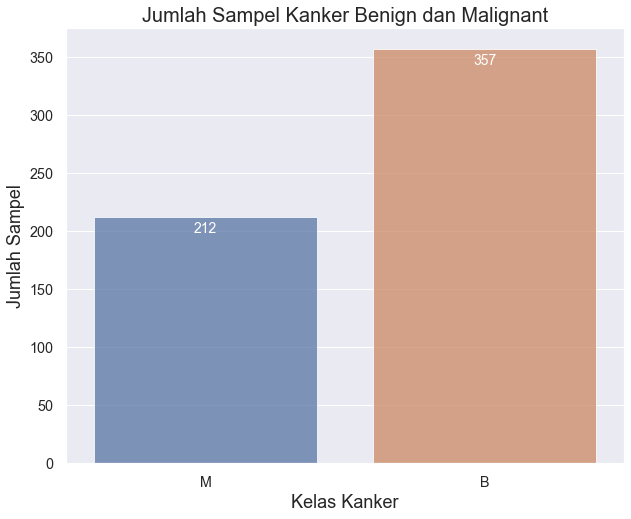

<Figure size 576x396 with 0 Axes>

In [11]:
# Memvisualisasikan jumlah sampel kanker Benign dan Malignant
plt.figure(figsize=(10,8))
sns.set(font_scale=1.3)
diag = sns.countplot(x='diagnosis', alpha=0.75, data=df_cancer)
plt.title('Jumlah Sampel Kanker Benign dan Malignant', size=20)
plt.xlabel('Kelas Kanker', size=18)
plt.ylabel('Jumlah Sampel', size=18)
for p in diag.patches:
    diag.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', color='white',
                   size=14,
                   xytext = (0, -12), 
                   textcoords = 'offset points')
plt.show()

plt.tight_layout()

fig = diag.get_figure()
fig.savefig('Jlh Sel Kangker.png', dpi=300)

### Visualisasi Pairplot
Untuk melihat pola sebaran data jika dikorelasikan dengan feature lainnya

<Figure size 1440x1440 with 0 Axes>

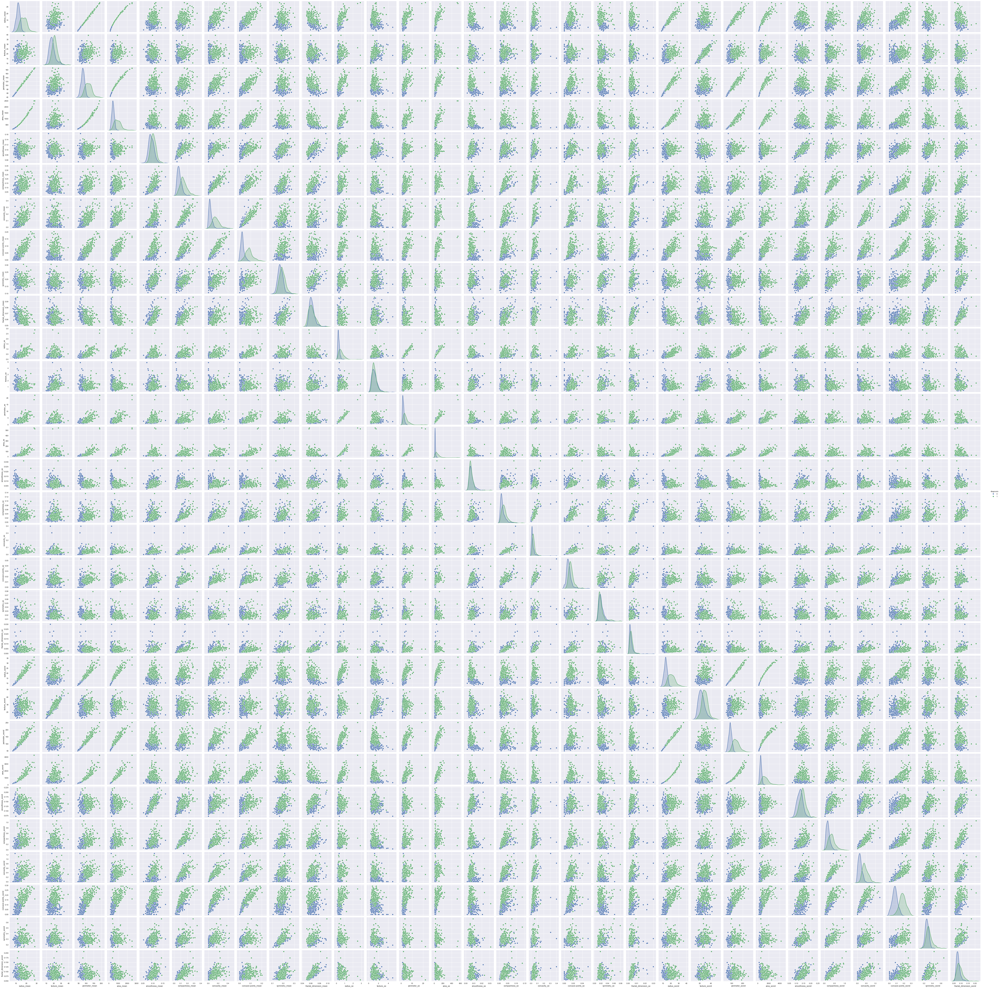

In [29]:
# Pairplot

# Set ukuran pairplot
plt.figure(figsize=(20,20))

# Generate pairplot
pair = sns.pairplot(data=df_cancer, hue='diagnosis')
#plt.title('Matriks Hubungan Antar Feature Sel Kanker Payudara', y=9, size = 20)

plt.show()

In [35]:
# Menyimpan Pairplot
pair.savefig('Matriks Pairplot Sel Kanker.png', dpi=300)

Pairplot dengan semua feature sangat lama proses analysisnya dan complicated sehingga susah untuk dilihat karena ukurannya yang kecil. Oleh karena itu feature di bagi kedalam tiga bagian

#### Pengelompokan Feature
Feature dapat dikelompokkan kedalam 3 kelompok:
1. Kelompok *_mean
2. Kelompok *_se
3. Kelompok *_worst

In [12]:
# Menyiapkan 3 dataframe untuk visualisasi pairplot tiap kelompok
kelmean = df_cancer.iloc[:, 0:11]
kelse = df_cancer.iloc[:, [0,11,12,13,14,15,16,17,18,19,20]]
kelworst = df_cancer.iloc[:, [0,21,22,23,24,25,26,27,28,29,30]]

<Figure size 1440x1440 with 0 Axes>

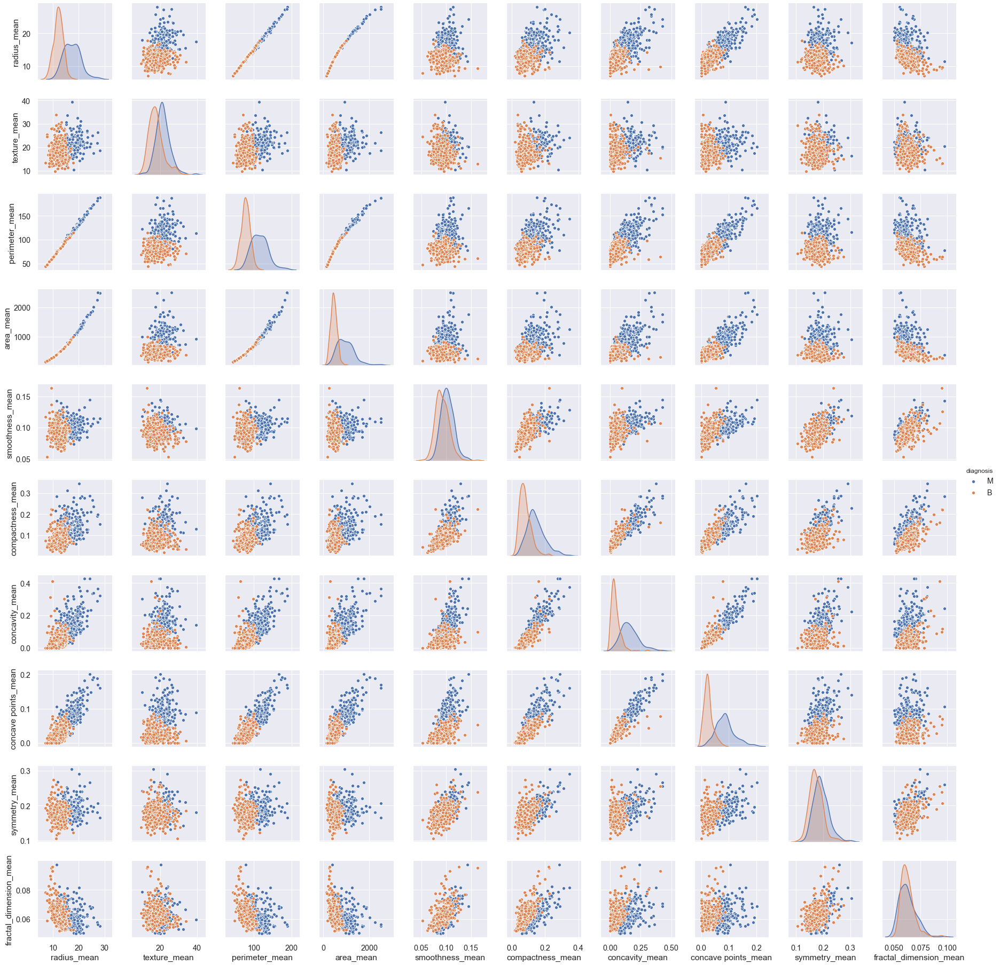

In [13]:
# Pairplot Kelompok Mean

# Set ukuran pairplot
plt.figure(figsize=(20,20))

# Generate pairplot
pairmean = sns.pairplot(data=kelmean, hue='diagnosis')

plt.show()

In [14]:
# Menyimpan Pairplot Kelompok Mean
pairmean.savefig('Matriks Pairplot Kelompok Mean.png', dpi=150)

<Figure size 1440x1440 with 0 Axes>

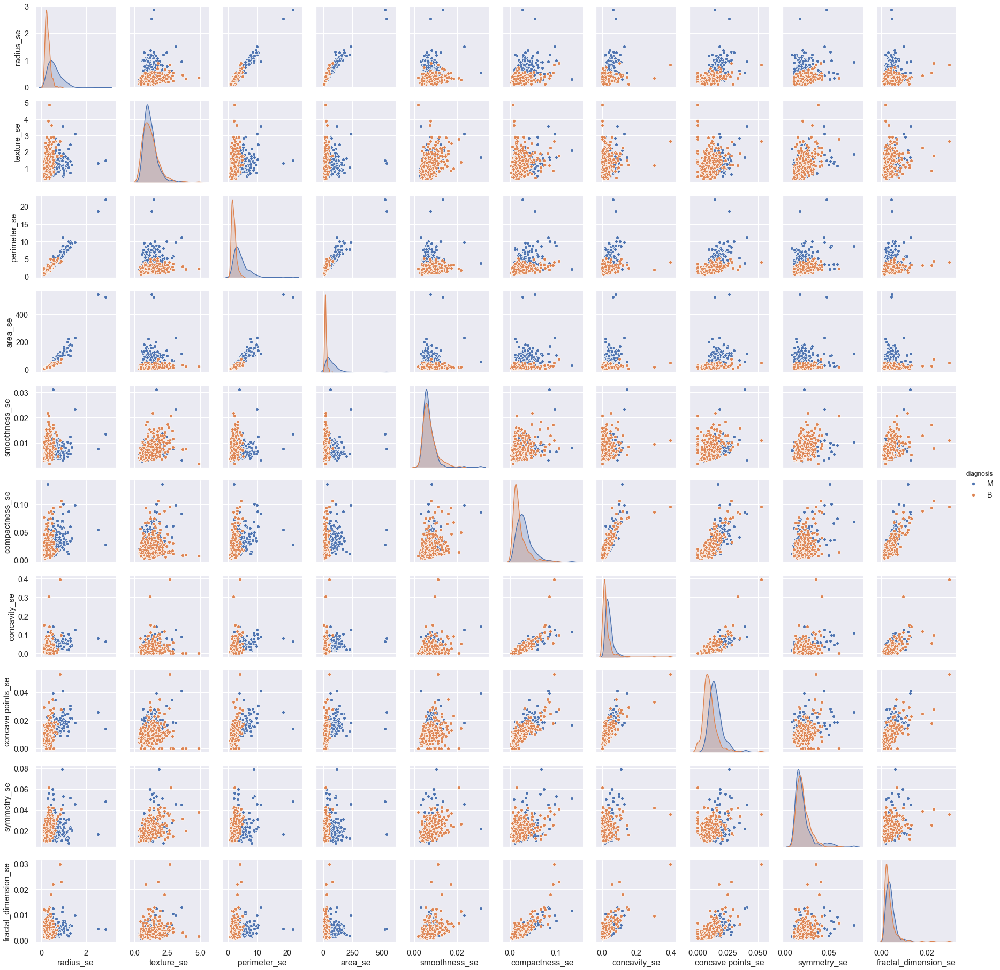

In [15]:
# Pairplot Kelompok Se

# Set ukuran pairplot
plt.figure(figsize=(20,20))

# Generate pairplot
pairse = sns.pairplot(data=kelse, hue='diagnosis')

#plt.title('Matriks Hubungan Antar Feature Sel Kanker Payudara', y=9, size = 20)

plt.show()

In [16]:
# Menyimpan Pairplot Kelompok Mean
pairse.savefig('Matriks Pairplot Kelompok Se.png', dpi=150)

<Figure size 1440x1440 with 0 Axes>

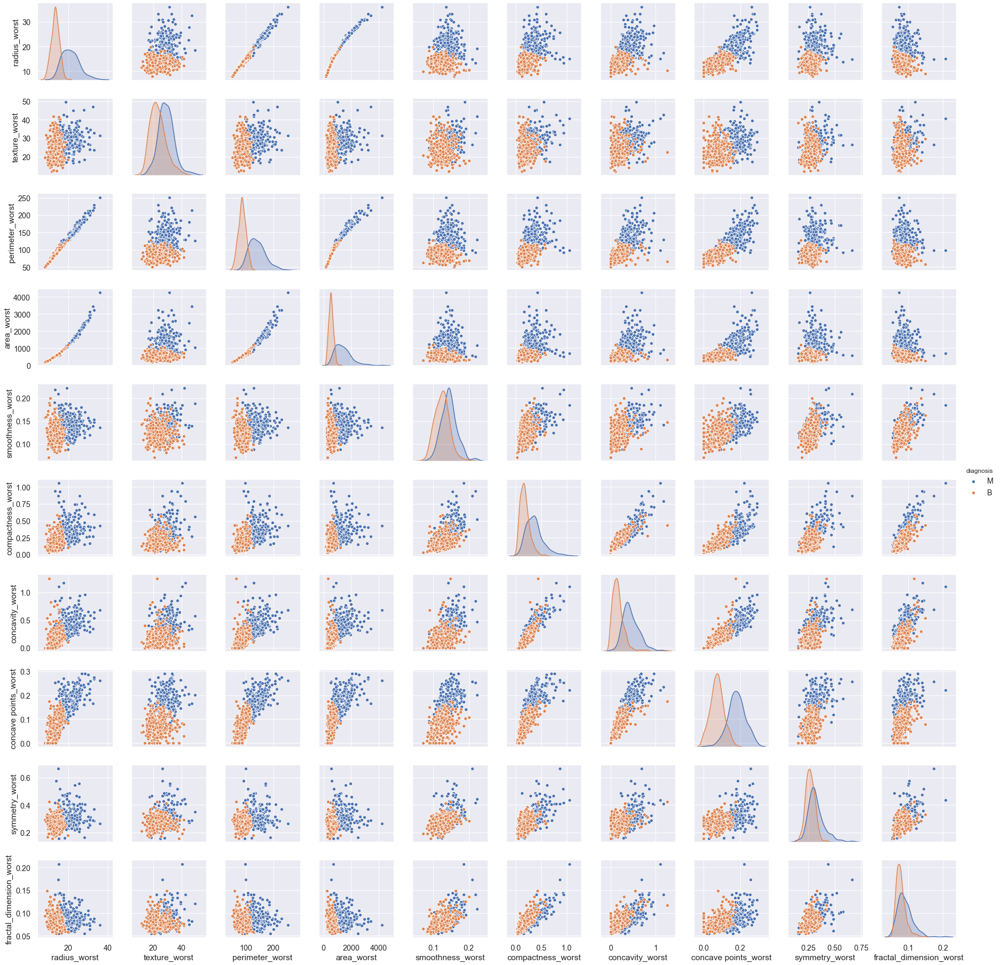

In [17]:
# Pairplot Kelompok Worst

# Set ukuran pairplot
plt.figure(figsize=(20,20))

# Generate pairplot
pairworst = sns.pairplot(data=kelworst, hue='diagnosis')
#plt.title('Matriks Hubungan Antar Feature Sel Kanker Payudara', y=9, size = 20)

plt.show()

In [18]:
# Menyimpan Pairplot Kelompok Mean
pairworst.savefig('Matriks Pairplot Kelompok Worst.png', dpi=150)

Dari pairplot pada tiga kelompok data di atas belum terlihat jelas cluster data antara benign dan malignant, kemudian dicoba untuk membuat swarmplot untuk melihat cluster data.

#### Preparing Data for Swarmplot

In [19]:
xmean = df_cancer.iloc[:, 1:11]
ymean = df_cancer.iloc[:, 0]
xse = df_cancer.iloc[:, 11:21]
yse = df_cancer.iloc[:, 0]
xworst = df_cancer.iloc[:, 21:31]
yworst = df_cancer.iloc[:, 0]

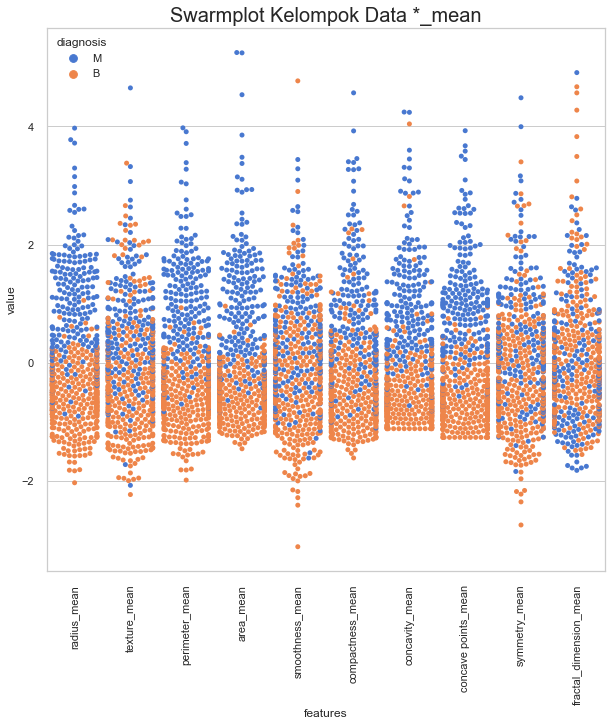

In [20]:
# Swarmplot Kelompok Data Mean

# Data dari xmean dan ymean dari data di atas

# Persiapan data untuk swarmplot
sns.set(style="whitegrid", palette="muted")
xmean_n_2 = (xmean - xmean.mean()) / (xmean.std()) # standardization
xmean = pd.concat([ymean, xmean_n_2.iloc[:,0:10]],axis=1)
xmean = pd.melt(xmean,id_vars="diagnosis",
                    var_name="features",
                    value_name='value')

# Membuat Swarmplot
plt.figure(figsize=(10,10))
#tic = time.time()
swpmean = sns.swarmplot(x="features", y="value", hue="diagnosis", data=xmean)
plt.title('Swarmplot Kelompok Data *_mean', size=20)
plt.xticks(rotation=90)

# Save Figure
fig = swpmean.get_figure()
fig.savefig('Swarmplot Kelompok Mean.png', dpi=150)

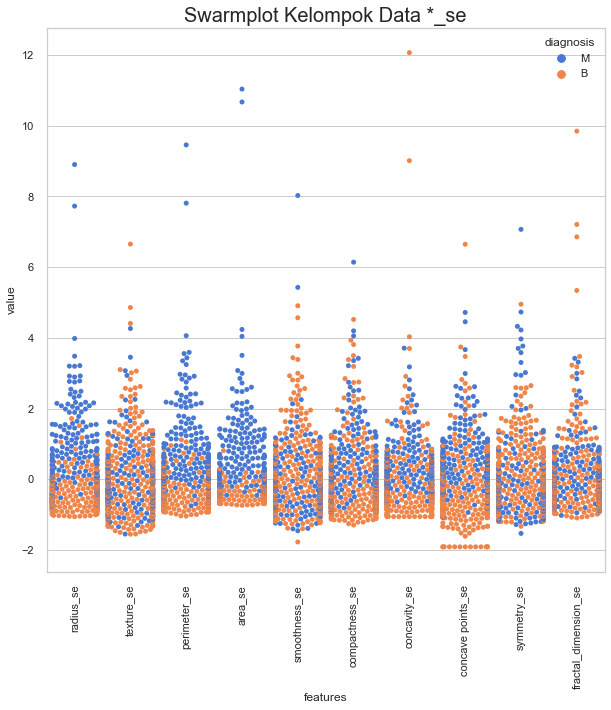

In [21]:
# Swarmplot Kelompok Data Se

# Data dari xse dan yse dari data di atas

# Persiapan data untuk swarmplot
sns.set(style="whitegrid", palette="muted")
xse_n_2 = (xse - xse.mean()) / (xse.std()) # standardization
xse = pd.concat([yse, xse_n_2.iloc[:,0:10]],axis=1)
xse = pd.melt(xse,id_vars="diagnosis",
                    var_name="features",
                    value_name='value')

# Membuat Swarmplot
plt.figure(figsize=(10,10))
#tic = time.time()
swpse = sns.swarmplot(x="features", y="value", hue="diagnosis", data=xse)
plt.title('Swarmplot Kelompok Data *_se', size=20)
plt.xticks(rotation=90)

# Save Figure
fig = swpse.get_figure()
fig.savefig('Swarmplot Kelompok Se.png', dpi=150)

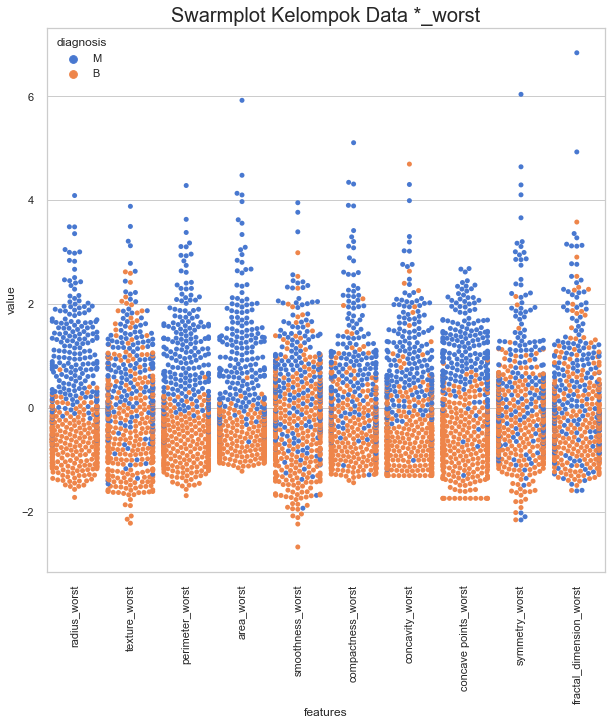

In [22]:
# Swarmplot Kelompok Data Worst

# Data dari xworst dan yworst dari data di atas

# Persiapan data untuk swarmplot
sns.set(style="whitegrid", palette="muted")
xworst_n_2 = (xworst - xworst.mean()) / (xworst.std()) # standardization
xworst = pd.concat([yworst, xworst_n_2.iloc[:,0:10]],axis=1)
xworst = pd.melt(xworst,id_vars="diagnosis",
                    var_name="features",
                    value_name='value')

# Membuat Swarmplot
plt.figure(figsize=(10,10))
#tic = time.time()
swpworst = sns.swarmplot(x="features", y="value", hue="diagnosis", data=xworst)
plt.title('Swarmplot Kelompok Data *_worst', size=20)
plt.xticks(rotation=90)

# Save Figure
fig = swpworst.get_figure()
fig.savefig('Swarmplot Kelompok Worst.png', dpi=150)

### One-Hot Encoder
Mengganti label M menjadi 1 dan B menjadi 0 pada feature diagnosis

In [23]:
cancer = df_cancer.copy()

In [24]:
# Merubah variabel diagnosis menjadi one-hot encoder
cancer['diagnosis'] = cancer['diagnosis'].map({'M':1, 'B':0})
cancer.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,1,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,1,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,1,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [25]:
cancer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    int64  
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

### Feature Selection
Dilakukan feature selection untuk mengetahui yang memiliki kontribusi terhadap prediksi.

Feature selection akan dilakukan dengan dua cara:
1. Univariate Selection
2. Feature Importance
3. Correlation Matrix dengan Heatmap

#### Univariate Selection

In [34]:
# Import Library
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

# Membagi Data
data = cancer.copy()
x = data.iloc[:,1:]  # independent feature (kolom)
y = data.iloc[:,0]   # dependent feature (diagnosis) 

# Membuat SelectKBest class utk ekstrak 10 feature terbaik
bestfeatures = SelectKBest(score_func=chi2, k=10) 
fit = bestfeatures.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)

#concat dua dataframes untuk visualisasi yang lebih baik 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  # Memberi nama kolom dataframe
print(featureScores.nlargest(10,'Score'))  # print 10 features terbaik

              Specs          Score
23       area_worst  112598.431564
3         area_mean   53991.655924
13          area_se    8758.504705
22  perimeter_worst    3665.035416
2    perimeter_mean    2011.102864
20     radius_worst     491.689157
0       radius_mean     266.104917
12     perimeter_se     250.571896
21    texture_worst     174.449400
1      texture_mean      93.897508


#### Feature Importance

[0.06768342 0.0180958  0.06116772 0.06394038 0.00855336 0.02408567
 0.05347392 0.08792874 0.00804969 0.00774529 0.02001447 0.00554283
 0.02577333 0.02745774 0.00629876 0.00870305 0.00530132 0.00941223
 0.0057977  0.00560273 0.08620715 0.02441534 0.09957915 0.06679314
 0.01851326 0.03229476 0.03575898 0.0881539  0.01719636 0.01045983]


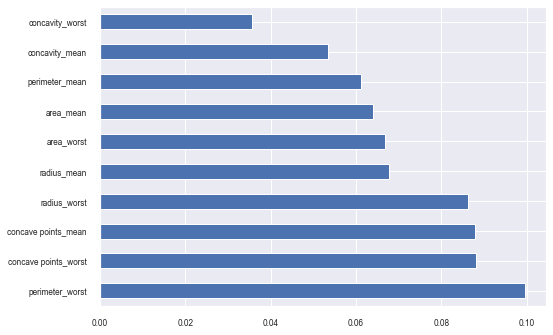

In [37]:
# Import Library
import numpy as np
import pandas as pd
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt

# Membagi data
data = cancer.copy()
x = cancer.iloc[:,1:]  #independent feature (kolom)
y = data.iloc[:,0]    #dependent feature (diagnosis)

# Menggunakan inbuilt class feature_importances dari tree based classifiers
model = ExtraTreesClassifier()
model.fit(x,y)
print(model.feature_importances_) 

#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=x.columns)
feat_importances.nlargest(10).plot(kind='barh', color=)
plt.show()

#### Heatmap dengan Korelasi
Untuk melihat keeratan hubungan antar feature

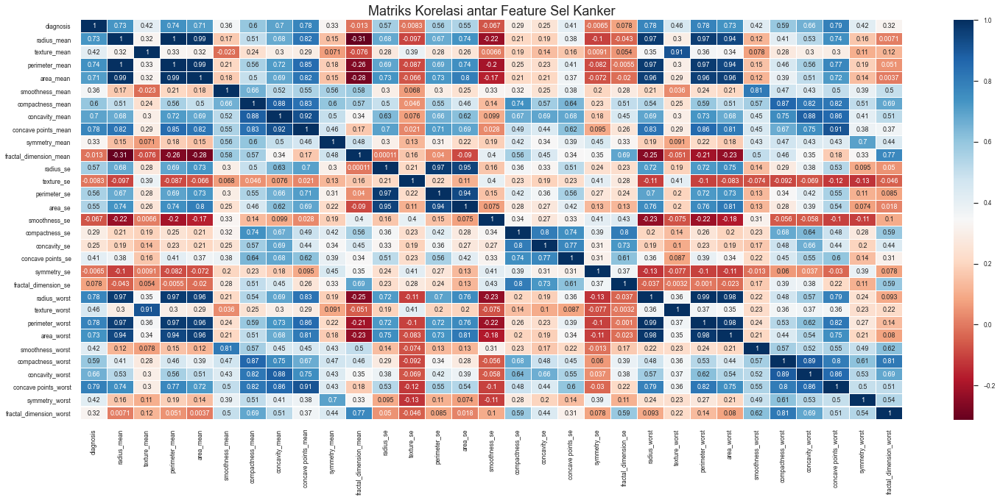

In [38]:
# Heatmap

# Set ukuran heatmap
plt.figure(figsize=(25,10))

# Generate Heat Map
sns.set(font_scale=0.75)
heat = sns.heatmap(data=cancer.astype(float).corr(),linewidths=0.1, 
            square=False,  linecolor='white', cmap='RdBu', annot=True)
plt.title('Matriks Korelasi antar Feature Sel Kanker', size=18)

plt.show()

# Menyimpan Grafik
#plt.tight_layout()

fig = heat.get_figure()
fig.savefig('Heatmap Sel Kangker.png', dpi=300)

##### Note:
Dari matriks korelasi heatmap, banyak terdapat hubungan yang erat antara feature dan masih complicated.

Dari Feature Importance, diperoleh feature-feature pilihan sebagai berikut :
1. area_worst
2. area_mean
3. perimeter_worst
4. perimeter_mean
5. radius_worst
6. radius_mean
7. concave points_worst
8. concave points_mean
9. concavity_mean
10. concavity_worst

Dari swarmplot dan pairplot dapat di ketahui bahwa feature yang jelas clusteringnya seara visual antara Benign dan Malignant adalah feature berikut (Feature pilihan):

Kelompok *_mean: 
1. radius_mean
2. perimeter_mean
3. area_mean
4. concave points_mean

Kelompok *_se:
1. radius_se
2. perimeter_se
3. area_se

Kelompok *_worst:
1. radius_worst
2. perimeter_worst
3. area_worst
4. concave points_worst

Oleh karena itu, untuk mendapatkan nila F1 Score dan accuracy yang tinggi, data yang akan di analisa terdiri dari 6 kelompok data dengan feature **diagnosis** sebagai dependent feature, yaitu: 
1. Data 1 @: x1 = all feature vs y1 = diagnosis
2. Data 2 @: x2 = all feature pilihan vs y2 = diagnosis
2. Data 3 @: x3 = kelompok *_mean pilihan vs y3 = diagnosis
3. Data 4 @: x4 = kelompok *_se pilihan vs y4 = diagnosis
4. Data 5 @: x5 = kelompok *_worst pilihan vs y5 = diagnosis
5. Data 6 @: x6 = data dari Feature Importance vs y6 = diagnosis

## 3. Data Preprocessing

### Prepare Data

In [150]:
y1 = cancer['diagnosis']
y2 = y1.copy()
y3 = y1.copy()
y4 = y1.copy()
y5 = y1.copy()
y6 = y1.copy()

In [40]:
y6

0      1
1      1
2      1
3      1
4      1
      ..
564    1
565    1
566    1
567    1
568    0
Name: diagnosis, Length: 569, dtype: int64

In [42]:
# 0 = Benign, 1 = Malignant
y6.value_counts()

0    357
1    212
Name: diagnosis, dtype: int64

In [43]:
# Kelompok data x1 yaitu semua feature kecuali diagnosis
x1 = cancer.drop(['diagnosis'],axis = 1)

In [57]:
x1

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [44]:
# Kelompok data x2 yaitu semua feature pilihan dari *_mean, *_se dan *_worst
x2 = cancer.iloc[:, [1,3,4,8,11,13,14,21,23,24,28]] 

In [62]:
x2

,radius_mean,perimeter_mean,area_mean,concave points_mean,radius_se,perimeter_se,area_se,radius_worst,perimeter_worst,area_worst,concave points_worst
0,17.99,122.80,1001.0,0.14710,1.0950,8.589,153.40,25.380,184.60,2019.0,0.2654
1,20.57,132.90,1326.0,0.07017,0.5435,3.398,74.08,24.990,158.80,1956.0,0.1860
2,19.69,130.00,1203.0,0.12790,0.7456,4.585,94.03,23.570,152.50,1709.0,0.2430
3,11.42,77.58,386.1,0.10520,0.4956,3.445,27.23,14.910,98.87,567.7,0.2575
4,20.29,135.10,1297.0,0.10430,0.7572,5.438,94.44,22.540,152.20,1575.0,0.1625
...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,142.00,1479.0,0.13890,1.1760,7.673,158.70,25.450,166.10,2027.0,0.2216
565,20.13,131.20,1261.0,0.09791,0.7655,5.203,99.04,23.690,155.00,1731.0,0.1628
566,16.60,108.30,858.1,0.05302,0.4564,3.425,48.55,18.980,126.70,1124.0,0.1418
567,20.60,140.10,1265.0,0.15200,0.7260,5.772,86.22,25.740,184.60,1821.0,0.2650


In [45]:
# Kelompok data X3 yaitu semua feature pilihan dari kelompok *_mean
x3 = cancer.iloc[:,[1,3,4,8]]

In [64]:
x3

,radius_mean,perimeter_mean,area_mean,concave points_mean
0,17.99,122.80,1001.0,0.14710
1,20.57,132.90,1326.0,0.07017
2,19.69,130.00,1203.0,0.12790
3,11.42,77.58,386.1,0.10520
4,20.29,135.10,1297.0,0.10430
...,...,...,...,...
564,21.56,142.00,1479.0,0.13890
565,20.13,131.20,1261.0,0.09791
566,16.60,108.30,858.1,0.05302
567,20.60,140.10,1265.0,0.15200


In [46]:
# Kelompok data x4 yaitu semua feature pilihan dari kelompok *_se
x4 = cancer.iloc[:,[11,13,14]]

In [66]:
x4

,radius_se,perimeter_se,area_se
0,1.0950,8.589,153.40
1,0.5435,3.398,74.08
2,0.7456,4.585,94.03
3,0.4956,3.445,27.23
4,0.7572,5.438,94.44
...,...,...,...
564,1.1760,7.673,158.70
565,0.7655,5.203,99.04
566,0.4564,3.425,48.55
567,0.7260,5.772,86.22


In [47]:
# Kelompok data x5 yaitu semua feature pilihan dari kelompok *_worst
x5 = cancer.iloc[:,[21,23,24,28]]

In [68]:
x5

,radius_worst,perimeter_worst,area_worst,concave points_worst
0,25.380,184.60,2019.0,0.2654
1,24.990,158.80,1956.0,0.1860
2,23.570,152.50,1709.0,0.2430
3,14.910,98.87,567.7,0.2575
4,22.540,152.20,1575.0,0.1625
...,...,...,...,...
564,25.450,166.10,2027.0,0.2216
565,23.690,155.00,1731.0,0.1628
566,18.980,126.70,1124.0,0.1418
567,25.740,184.60,1821.0,0.2650


In [151]:
# Kelompok data x6 yaitu feature pilihan dari Feature Importance
x6 = cancer.iloc[:,[1,3,4,7,8,21,23,24,27,28]]

In [51]:
x6

,radius_mean,texture_mean,perimeter_mean,area_mean,concavity_mean,concave points_mean,perimeter_se,area_se,radius_worst,texture_worst,perimeter_worst,area_worst,concavity_worst,concave points_worst
0,17.99,10.38,122.80,1001.0,0.30010,0.14710,8.589,153.40,25.380,17.33,184.60,2019.0,0.7119,0.2654
1,20.57,17.77,132.90,1326.0,0.08690,0.07017,3.398,74.08,24.990,23.41,158.80,1956.0,0.2416,0.1860
2,19.69,21.25,130.00,1203.0,0.19740,0.12790,4.585,94.03,23.570,25.53,152.50,1709.0,0.4504,0.2430
3,11.42,20.38,77.58,386.1,0.24140,0.10520,3.445,27.23,14.910,26.50,98.87,567.7,0.6869,0.2575
4,20.29,14.34,135.10,1297.0,0.19800,0.10430,5.438,94.44,22.540,16.67,152.20,1575.0,0.4000,0.1625
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.24390,0.13890,7.673,158.70,25.450,26.40,166.10,2027.0,0.4107,0.2216
565,20.13,28.25,131.20,1261.0,0.14400,0.09791,5.203,99.04,23.690,38.25,155.00,1731.0,0.3215,0.1628
566,16.60,28.08,108.30,858.1,0.09251,0.05302,3.425,48.55,18.980,34.12,126.70,1124.0,0.3403,0.1418
567,20.60,29.33,140.10,1265.0,0.35140,0.15200,5.772,86.22,25.740,39.42,184.60,1821.0,0.9387,0.2650


### Split Data

In [52]:
# Import Library
import sklearn
from sklearn.model_selection import train_test_split

#### Split Data 1

In [53]:
# Data 1 @: x1 = all feature vs y1 = diagnosis
# Membagi Data 1 kedalam Training Set = 80% dan Test Set = 20%
x1_train, x1_test, y1_train, y1_test = train_test_split(x1, y1, test_size=0.2, random_state= 60)

In [54]:
print('Shape of x1_train: ', x1_train.shape)
print('Shape of x1_test: ', x1_test.shape)
print('Shape of y1_train: ', y1_train.shape)
print('Shape of y1_test: ', y1_test.shape)

Shape of x1_train:  (455, 30)
Shape of x1_test:  (114, 30)
Shape of y1_train:  (455,)
Shape of y1_test:  (114,)


#### Split Data 2

In [55]:
# Data 2 @: x2 = all feature pilihan vs y2 = diagnosis
# Membagi Data 2 kedalam Training Set = 80% dan Test Set = 20%
x2_train, x2_test, y2_train, y2_test = train_test_split(x2, y2, test_size=0.2, random_state= 60)

In [56]:
print('Shape of x2_train: ', x2_train.shape)
print('Shape of x2_test: ', x2_test.shape)
print('Shape of y2_train: ', y2_train.shape)
print('Shape of y2_test: ', y2_test.shape)

Shape of x2_train:  (455, 11)
Shape of x2_test:  (114, 11)
Shape of y2_train:  (455,)
Shape of y2_test:  (114,)


#### Split Data 3

In [57]:
# Data 3 @: x3 = kelompok *_mean pilihan vs y3 = diagnosis
# Membagi Data 3 kedalam Training Set = 80% dan Test Set = 20%
x3_train, x3_test, y3_train, y3_test = train_test_split(x3, y3, test_size=0.2, random_state= 60)

In [58]:
print('Shape of x3_train: ', x3_train.shape)
print('Shape of x3_test: ', x3_test.shape)
print('Shape of y3_train: ', y3_train.shape)
print('Shape of y3_test: ', y3_test.shape)

Shape of x3_train:  (455, 4)
Shape of x3_test:  (114, 4)
Shape of y3_train:  (455,)
Shape of y3_test:  (114,)


#### Split Data 4

In [59]:
# Data 4 @: x4 = kelompok *_se pilihan vs y4 = diagnosis
# Membagi Data 4 kedalam Training Set = 80% dan Test Set = 20%
x4_train, x4_test, y4_train, y4_test = train_test_split(x4, y4, test_size=0.2, random_state= 60)

In [60]:
print('Shape of x4_train: ', x4_train.shape)
print('Shape of x4_test: ', x4_test.shape)
print('Shape of y4_train: ', y4_train.shape)
print('Shape of y4_test: ', y4_test.shape)

Shape of x4_train:  (455, 3)
Shape of x4_test:  (114, 3)
Shape of y4_train:  (455,)
Shape of y4_test:  (114,)


#### Split Data 5

In [61]:
# Data 5 @: x5 = kelompok *_worst pilihan vs y5 = diagnosis
# Membagi Data 5 kedalam Training Set = 80% dan Test Set = 20%
x5_train, x5_test, y5_train, y5_test = train_test_split(x5, y5, test_size=0.2, random_state= 60)

In [62]:
print('Shape of x5_train: ', x5_train.shape)
print('Shape of x5_test: ', x5_test.shape)
print('Shape of y5_train: ', y5_train.shape)
print('Shape of y5_test: ', y5_test.shape)

Shape of x5_train:  (455, 4)
Shape of x5_test:  (114, 4)
Shape of y5_train:  (455,)
Shape of y5_test:  (114,)


#### Split Data 6

In [157]:
# Data 6 @: x6 = data dari Univ. Selection & Feature Importance vs y6 = diagnosis
# Membagi Data 6 kedalam Training Set = 80% dan Test Set = 20%
x6_train, x6_test, y6_train, y6_test = train_test_split(x6, y6, test_size=0.2, random_state= 60)

In [158]:
print('Shape of x6_train: ', x6_train.shape)
print('Shape of x6_test: ', x6_test.shape)
print('Shape of y6_train: ', y6_train.shape)
print('Shape of y6_test: ', y6_test.shape)

Shape of x6_train:  (455, 10)
Shape of x6_test:  (114, 10)
Shape of y6_train:  (455,)
Shape of y6_test:  (114,)


## 4. Data Modelling with Classifier

Data modelling akan menggunakan 4 lagoritma, yaitu :
1. Support Vector Machine (SVM)
2. Decision Tree
3. Random Forest
4. K-Nearest Neighbors (KNN)

Masing-masing dataset (Data 1 s/d Data 6) akan di analisa dengan SVM, dan Data dengan F1 Score tertinggi akan digunakan untuk analisa dengan algoritma yang lain.

### 4.1 Support Vector Machine (SVM)

#### Import Library SVM

In [65]:
# Import library SVM
import sklearn
from sklearn import svm

#### Train Data 1

In [66]:
svm_model1 = svm.SVC(kernel='rbf')
svm_model1.fit(x1_train, y1_train)

SVC()

#### Evaluate Data 1

In [67]:
svm_score1 = svm_model1.score(x1_test, y1_test)
print('Model Accuracy Data 1: ', round(svm_score1*100,2),'%')

Model Accuracy Data 1:  97.37 %


##### Eksperimen nilai random_state
Eksperimen berikut menggunakan test_size 0.3
* random_state = 0, accuracy = 92.40%
* random_state = 10, accuracy = 93.57%
* random_state = 20, accuracy = 92.40%
* random_state = 30, accuracy = 91.23%
* random_state = 40, accuracy = 92.98%
* random_state = 50, accuracy = 94.15%
* random_state = 60, accuracy = 95.91% -> Optimal
* random_state = 70, accuracy = 91.23%
* random_state = 80, accuracy = 88.89%
* random_state = 90, accuracy = 91.23%
* random_state = 100, accuracy = 90.64%

Sehingga untuk seterusnya menggunakan nilai random_state = 60

##### Eksperimen nilai test_size
Eksperimen berikut menggunakan random_state  60
* test_size = 0.1, accuracy = 98.25%
* test_size = 0.2, accuracy = 97.37% -> dipilih agar tidak under test
* test_size = 0.3, accuracy = 95.91%
* test_size = 0.4, accuracy = 93.86%

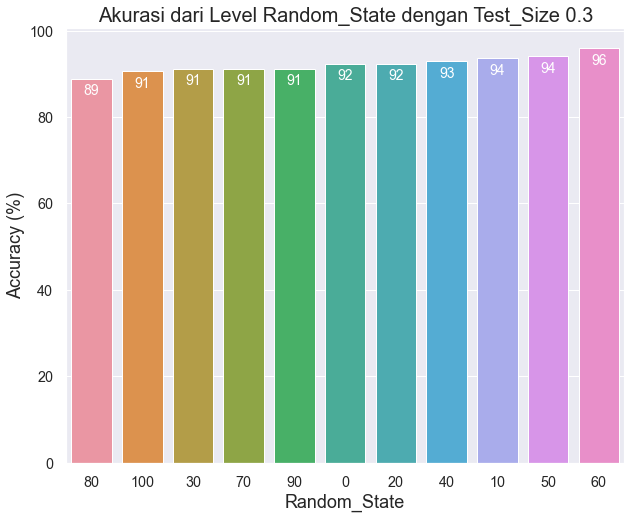

<Figure size 576x396 with 0 Axes>

In [221]:
# Grafik Random_State terhadap Accuracy
# Initialise data of list.
randst = {'rstate':['0','10','20','30','40','50','60','70','80','90','100'],
           'accuracy':[92.40,93.57,92.40,91.23,92.98,94.15,95.91,91.23,88.89,91.23,90.64]}

# Create DataFrame
df_rand = pd.DataFrame(randst)

# Creat bar graph
plt.figure(figsize=(10,8))
sns.set(font_scale=1.3)
grandst = sns.barplot(x='rstate', y='accuracy', data=df_rand, order=df_rand.sort_values('accuracy', ascending=True).rstate)
plt.title('Akurasi dari Level Random_State dengan Test_Size 0.3', size=20)
plt.xlabel('Random_State', size=18)
plt.ylabel('Accuracy (%)', size=18)
for p in grandst.patches:
    grandst.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', color='white',
                   size=14,
                   xytext = (0, -12), 
                   textcoords = 'offset points')
    
plt.show()

plt.tight_layout()

fig = grandst.get_figure()
fig.savefig('Accuracy pada Level Random_State.png', dpi=300)

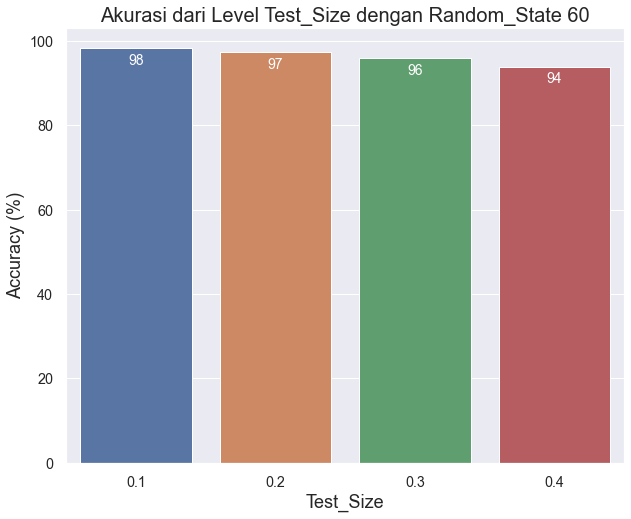

<Figure size 576x396 with 0 Axes>

In [222]:
# Grafik Test_Size terhadap Accuracy
# Initialise data of list.
testsz = {'test':['0.1','0.2','0.3','0.4'],
           'accuracy':[98.25,97.37,95.91,93.86]}

# Create DataFrame
df_test = pd.DataFrame(testsz)

# Creat bar graph
plt.figure(figsize=(10,8))
sns.set(font_scale=1.3)
gtest = sns.barplot(x='test', y='accuracy', data=df_test) #, order=df_rand.sort_values('accuracy', ascending=True).rstate)
plt.title('Akurasi dari Level Test_Size dengan Random_State 60', size=20)
plt.xlabel('Test_Size', size=18)
plt.ylabel('Accuracy (%)', size=18)
for p in gtest.patches:
    gtest.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', color='white',
                   size=14,
                   xytext = (0, -12), 
                   textcoords = 'offset points')
    
plt.show()

plt.tight_layout()

fig = gtest.get_figure()
fig.savefig('Accuracy pada Level Test_Size.png', dpi=300)

#### Making Prediction Data 1

In [68]:
# Melihat Hasil Prediksi Jenis Kanker

y1_predsvm = svm_model1.predict(x1_test)

# Prediksi jenis kanker dari test data pada baris ke-10-20
print('Prediksi Jenis Kanker: ', y1_predsvm[11:21])

# Aktual jenis kanker dari test data pada baris ke-10-20
print('Aktual Jenis Kanker: ', y1_test[11:21])

Prediksi Jenis Kanker:  [0 0 0 0 0 0 1 1 0 1]
Aktual Jenis Kanker:  51     0
471    0
467    0
19     0
404    0
418    0
392    1
244    1
531    0
25     1
Name: diagnosis, dtype: int64


#### F1 Score Data 1

In [69]:
from sklearn import metrics

print("Classification report for classifier %s:\n%s\n"
      % (svm_model1, metrics.classification_report(y1_test, y1_predsvm)))
print("Confusion matrix:\n%s" % metrics.confusion_matrix(y1_test, y1_predsvm))

Classification report for classifier SVC():
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        74
           1       1.00      0.93      0.96        40

    accuracy                           0.97       114
   macro avg       0.98      0.96      0.97       114
weighted avg       0.97      0.97      0.97       114


Confusion matrix:
[[74  0]
 [ 3 37]]


#### Train Data 2

In [70]:
svm_model2 = svm.SVC(kernel='rbf')
svm_model2.fit(x2_train, y2_train)

SVC()

#### Evaluate Data 2

In [71]:
svm_score2 = svm_model2.score(x2_test, y2_test)
print('Model Accuracy Data 2: ', round(svm_score2*100,2),'%')

Model Accuracy Data 2:  97.37 %


#### Making Prediction Data 2

In [72]:
# Melihat Hasil Prediksi Jenis Kanker

y2_predsvm = svm_model2.predict(x2_test)

# Prediksi jenis kanker dari test data pada baris ke-10-20
print('Prediksi Jenis Kanker: ', y2_predsvm[11:21])

# Aktual jenis kanker dari test data pada baris ke-10-20
print('Aktual Jenis Kanker: ', y2_test[11:21])

Prediksi Jenis Kanker:  [0 0 0 0 0 0 1 1 0 1]
Aktual Jenis Kanker:  51     0
471    0
467    0
19     0
404    0
418    0
392    1
244    1
531    0
25     1
Name: diagnosis, dtype: int64


#### F1 Score Data 2

In [73]:
from sklearn import metrics

print("Classification report for classifier %s:\n%s\n"
      % (svm_model2, metrics.classification_report(y2_test, y2_predsvm)))
print("Confusion matrix:\n%s" % metrics.confusion_matrix(y2_test, y2_predsvm))

Classification report for classifier SVC():
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        74
           1       1.00      0.93      0.96        40

    accuracy                           0.97       114
   macro avg       0.98      0.96      0.97       114
weighted avg       0.97      0.97      0.97       114


Confusion matrix:
[[74  0]
 [ 3 37]]


#### Train Data 3

In [74]:
svm_model3 = svm.SVC(kernel='rbf')
svm_model3.fit(x3_train, y3_train)

SVC()

#### Evaluate Data 3

In [75]:
svm_score3 = svm_model3.score(x3_test, y3_test)
print('Model Accuracy Data 3: ', round(svm_score3*100,2),'%')

Model Accuracy Data 3:  94.74 %


#### Making Prediction Data 3

In [76]:
# Melihat Hasil Prediksi Jenis Kanker

y3_predsvm = svm_model3.predict(x3_test)

# Prediksi jenis kanker dari test data pada baris ke-10-20
print('Prediksi Jenis Kanker: ', y3_predsvm[11:21])

# Aktual jenis kanker dari test data pada baris ke-10-20
print('Aktual Jenis Kanker: ', y3_test[11:21])

Prediksi Jenis Kanker:  [0 0 0 0 0 0 1 1 0 1]
Aktual Jenis Kanker:  51     0
471    0
467    0
19     0
404    0
418    0
392    1
244    1
531    0
25     1
Name: diagnosis, dtype: int64


#### F1 Score Data 3

In [78]:
from sklearn import metrics

print("Classification report for classifier %s:\n%s\n"
      % (svm_model3, metrics.classification_report(y3_test, y3_predsvm)))
print("Confusion matrix:\n%s" % metrics.confusion_matrix(y3_test, y3_predsvm))

Classification report for classifier SVC():
              precision    recall  f1-score   support

           0       0.93      1.00      0.96        74
           1       1.00      0.85      0.92        40

    accuracy                           0.95       114
   macro avg       0.96      0.93      0.94       114
weighted avg       0.95      0.95      0.95       114


Confusion matrix:
[[74  0]
 [ 6 34]]


#### Train Data 4

In [79]:
svm_model4 = svm.SVC(kernel='rbf')
svm_model4.fit(x4_train, y4_train)

SVC()

#### Evaluate Data 4

In [80]:
svm_score4 = svm_model4.score(x4_test, y4_test)
print('Model Accuracy Data 4: ', round(svm_score4*100,2),'%')

Model Accuracy Data 4:  88.6 %


#### Making Prediction Data 4

In [81]:
# Melihat Hasil Prediksi Jenis Kanker

y4_predsvm = svm_model4.predict(x4_test)

# Prediksi jenis kanker dari test data pada baris ke-10-20
print('Prediksi Jenis Kanker: ', y4_predsvm[11:21])

# Aktual jenis kanker dari test data pada baris ke-10-20
print('Aktual Jenis Kanker: ', y4_test[11:21])

Prediksi Jenis Kanker:  [0 1 0 0 0 0 1 1 0 1]
Aktual Jenis Kanker:  51     0
471    0
467    0
19     0
404    0
418    0
392    1
244    1
531    0
25     1
Name: diagnosis, dtype: int64


#### F1 Score Data 4

In [82]:
from sklearn import metrics

print("Classification report for classifier %s:\n%s\n"
      % (svm_model4, metrics.classification_report(y4_test, y4_predsvm)))
print("Confusion matrix:\n%s" % metrics.confusion_matrix(y4_test, y4_predsvm))

Classification report for classifier SVC():
              precision    recall  f1-score   support

           0       0.88      0.96      0.92        74
           1       0.91      0.75      0.82        40

    accuracy                           0.89       114
   macro avg       0.89      0.85      0.87       114
weighted avg       0.89      0.89      0.88       114


Confusion matrix:
[[71  3]
 [10 30]]


#### Train Data 5

In [83]:
svm_model5 = svm.SVC(kernel='rbf')
svm_model5.fit(x5_train, y5_train)

SVC()

#### Evaluate Data 5

In [84]:
svm_score5 = svm_model5.score(x5_test, y5_test)
print('Model Accuracy Data 5: ', round(svm_score5*100,2),'%')

Model Accuracy Data 5:  97.37 %


#### Making Prediction Data 5

In [85]:
# Melihat Hasil Prediksi Jenis Kanker

y5_predsvm = svm_model5.predict(x5_test)

# Prediksi jenis kanker dari test data pada baris ke-10-20
print('Prediksi Jenis Kanker: ', y5_predsvm[11:21])

# Aktual jenis kanker dari test data pada baris ke-10-20
print('Aktual Jenis Kanker: ', y5_test[11:21])

Prediksi Jenis Kanker:  [0 0 0 0 0 0 1 1 0 1]
Aktual Jenis Kanker:  51     0
471    0
467    0
19     0
404    0
418    0
392    1
244    1
531    0
25     1
Name: diagnosis, dtype: int64


#### F1 Score Data 5

In [86]:
from sklearn import metrics

print("Classification report for classifier %s:\n%s\n"
      % (svm_model5, metrics.classification_report(y5_test, y5_predsvm)))
print("Confusion matrix:\n%s" % metrics.confusion_matrix(y5_test, y5_predsvm))

Classification report for classifier SVC():
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        74
           1       1.00      0.93      0.96        40

    accuracy                           0.97       114
   macro avg       0.98      0.96      0.97       114
weighted avg       0.97      0.97      0.97       114


Confusion matrix:
[[74  0]
 [ 3 37]]


#### Train Data 6

In [159]:
svm_model6 = svm.SVC(kernel='rbf')
svm_model6.fit(x6_train, y6_train)

SVC()

#### Evaluate Data 6

In [160]:
svm_score6 = svm_model6.score(x6_test, y6_test)
print('Model Accuracy Data 6: ', round(svm_score6*100,2),'%')

Model Accuracy Data 6:  97.37 %


#### Making Prediction Data 6

In [161]:
# Melihat Hasil Prediksi Jenis Kanker

y6_predsvm = svm_model6.predict(x6_test)

# Prediksi jenis kanker dari test data pada baris ke-10-20
print('Prediksi Jenis Kanker: ', y6_predsvm[11:21])

# Aktual jenis kanker dari test data pada baris ke-10-20
print('Aktual Jenis Kanker: ', y6_test[11:21])

Prediksi Jenis Kanker:  [0 0 0 0 0 0 1 1 0 1]
Aktual Jenis Kanker:  51     0
471    0
467    0
19     0
404    0
418    0
392    1
244    1
531    0
25     1
Name: diagnosis, dtype: int64


#### F1 Score Data 6

In [162]:
from sklearn import metrics

print("Classification report for classifier %s:\n%s\n"
      % (svm_model6, metrics.classification_report(y6_test, y6_predsvm)))
print("Confusion matrix:\n%s" % metrics.confusion_matrix(y6_test, y6_predsvm))

Classification report for classifier SVC():
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        74
           1       1.00      0.93      0.96        40

    accuracy                           0.97       114
   macro avg       0.98      0.96      0.97       114
weighted avg       0.97      0.97      0.97       114


Confusion matrix:
[[74  0]
 [ 3 37]]


### Kesimpulan Hasil dengan SVM
1. test_size terbaik adalah 0.2
2. random_state terbaik adalah 60
3. F1 Score terbaik dari semua kelompok data adalah:
    * Data 1 - all feature = 0.97
    * Data 2 - all feature pilihan = 0.97
    * Data 3 - kelompok *_mean pilihan = 0.95
    * Data 4 - kelompok *_se pilihan = 0.89
    * Data 5 - kelompok *_worst pilihan = 0.97
    * Data 6 - kelompok Feature Selection = 0.97
4. Untuk Decision Tree dan Random Forest akan menggunakan Data 1, 2 dan Data 6
5. Untuk KNN menggunakan kelompok Data 1

  ### 4.2. Decision Tree

#### Import Library Decision Tree

In [115]:
#Import Library
import sklearn
from sklearn.tree import DecisionTreeClassifier

#### Train Data 1

In [116]:
dt_model1 = DecisionTreeClassifier()
dt_model1.fit(x1_train, y1_train)

DecisionTreeClassifier()

#### Evaluate Data 1

In [119]:
dtmodel_score1 =  dt_model1.score(x1_test, y1_test)
print('Model Accuracy Data 1: ', round(dtmodel_score1*100,2),'%')

Model Accuracy Data 1:  90.35 %


#### Making Prediction Data 1

In [120]:
# Melihat Hasil Prediksi Jenis Kanker

y1_preddt = dt_model1.predict(x1_test)

# Prediksi jenis kanker dari test data pada baris ke-10-20
print('Prediksi Jenis Kanker: ', y1_preddt[11:21])

# Aktual jenis kanker dari test data pada baris ke-10-20
print('Aktual Jenis Kanker: ', y1_test[11:21])

Prediksi Jenis Kanker:  [0 1 0 0 0 0 1 1 0 1]
Aktual Jenis Kanker:  51     0
471    0
467    0
19     0
404    0
418    0
392    1
244    1
531    0
25     1
Name: diagnosis, dtype: int64


#### F1 Score Data 1

In [121]:
from sklearn import metrics

print("Classification report for classifier %s:\n%s\n"
      % (dt_model1, metrics.classification_report(y1_test, y1_preddt)))
print("Confusion matrix:\n%s" % metrics.confusion_matrix(y1_test, y1_preddt))

Classification report for classifier DecisionTreeClassifier():
              precision    recall  f1-score   support

           0       0.96      0.89      0.92        74
           1       0.82      0.93      0.87        40

    accuracy                           0.90       114
   macro avg       0.89      0.91      0.90       114
weighted avg       0.91      0.90      0.90       114


Confusion matrix:
[[66  8]
 [ 3 37]]


#### Train Data 2

In [122]:
dt_model2 = DecisionTreeClassifier()
dt_model2.fit(x2_train, y2_train)

DecisionTreeClassifier()

#### Evaluate Data 2

In [123]:
dtmodel_score2 =  dt_model2.score(x2_test, y2_test)
print('Model Accuracy Data 2: ', round(dtmodel_score2*100,2),'%')

Model Accuracy Data 2:  93.86 %


#### Making Prediction Data 2

In [124]:
# Melihat Hasil Prediksi Jenis Kanker

y2_preddt = dt_model2.predict(x2_test)

# Prediksi jenis kanker dari test data pada baris ke-10-20
print('Prediksi Jenis Kanker: ', y2_preddt[11:21])

# Aktual jenis kanker dari test data pada baris ke-10-20
print('Aktual Jenis Kanker: ', y2_test[11:21])

Prediksi Jenis Kanker:  [0 0 0 0 0 0 1 1 0 1]
Aktual Jenis Kanker:  51     0
471    0
467    0
19     0
404    0
418    0
392    1
244    1
531    0
25     1
Name: diagnosis, dtype: int64


#### F1 Score Data 2

In [125]:
from sklearn import metrics

print("Classification report for classifier %s:\n%s\n"
      % (dt_model2, metrics.classification_report(y2_test, y2_preddt)))
print("Confusion matrix:\n%s" % metrics.confusion_matrix(y2_test, y2_preddt))

Classification report for classifier DecisionTreeClassifier():
              precision    recall  f1-score   support

           0       0.97      0.93      0.95        74
           1       0.88      0.95      0.92        40

    accuracy                           0.94       114
   macro avg       0.93      0.94      0.93       114
weighted avg       0.94      0.94      0.94       114


Confusion matrix:
[[69  5]
 [ 2 38]]


####  Train Data 6

In [167]:
dt_model6 = DecisionTreeClassifier()
dt_model6.fit(x6_train, y6_train)

DecisionTreeClassifier()

#### Evaluate Data 6

In [174]:
dtmodel_score6 =  dt_model6.score(x6_test, y6_test)
print('Model Accuracy Data 6: ', round(dtmodel_score6*100,2),'%')

Model Accuracy Data 6:  94.74 %


#### Making Prediction Data 6

In [175]:
# Melihat Hasil Prediksi Jenis Kanker

y6_preddt = dt_model6.predict(x6_test)

# Prediksi jenis kanker dari test data pada baris ke-10-20
print('Prediksi Jenis Kanker: ', y6_preddt[11:21])

# Aktual jenis kanker dari test data pada baris ke-10-20
print('Aktual Jenis Kanker: ', y6_test[11:21])

Prediksi Jenis Kanker:  [0 0 0 0 0 0 1 1 0 1]
Aktual Jenis Kanker:  51     0
471    0
467    0
19     0
404    0
418    0
392    1
244    1
531    0
25     1
Name: diagnosis, dtype: int64


#### F1 Score Data 6

In [176]:
from sklearn import metrics

print("Classification report for classifier %s:\n%s\n"
      % (dt_model6, metrics.classification_report(y6_test, y6_preddt)))
print("Confusion matrix:\n%s" % metrics.confusion_matrix(y6_test, y6_preddt))

Classification report for classifier DecisionTreeClassifier():
              precision    recall  f1-score   support

           0       0.95      0.97      0.96        74
           1       0.95      0.90      0.92        40

    accuracy                           0.95       114
   macro avg       0.95      0.94      0.94       114
weighted avg       0.95      0.95      0.95       114


Confusion matrix:
[[72  2]
 [ 4 36]]


### 4.3. Random Forest

#### Import Library RF

In [177]:
import sklearn
from sklearn.ensemble import RandomForestClassifier

#### Train Data 1

In [178]:
rf_model1 = RandomForestClassifier()
rf_model1.fit(x1_train, y1_train)

RandomForestClassifier()

#### Evaluate Data 1

In [179]:
model_score1 =  rf_model1.score(x1_test, y1_test)
print('Model Accuracy Data 1: ', round(model_score1*100,2),'%')

Model Accuracy Data 1:  97.37 %


#### Making Prediction Data 1

In [180]:
# Melihat Hasil Prediksi Jenis Kanker

y1_predrf = rf_model1.predict(x1_test)

# Prediksi jenis kanker dari test data pada baris ke-10-20
print('Prediksi Jenis Kanker: ', y1_predrf[11:21])

# Aktual jenis kanker dari test data pada baris ke-10-20
print('Aktual Jenis Kanker: ', y1_test[11:21])

Prediksi Jenis Kanker:  [0 0 0 0 0 0 1 1 0 1]
Aktual Jenis Kanker:  51     0
471    0
467    0
19     0
404    0
418    0
392    1
244    1
531    0
25     1
Name: diagnosis, dtype: int64


#### F1 Score Data 1

In [181]:
from sklearn import metrics

print("Classification report for classifier %s:\n%s\n"
      % (rf_model1, metrics.classification_report(y1_test, y1_predrf)))
print("Confusion matrix:\n%s" % metrics.confusion_matrix(y1_test, y1_predrf))

Classification report for classifier RandomForestClassifier():
              precision    recall  f1-score   support

           0       0.97      0.99      0.98        74
           1       0.97      0.95      0.96        40

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114


Confusion matrix:
[[73  1]
 [ 2 38]]


#### Train Data 2

In [182]:
rf_model2 = RandomForestClassifier()
rf_model2.fit(x2_train, y2_train)

RandomForestClassifier()

####  Evaluate Data  2

In [183]:
model_score2 =  rf_model2.score(x2_test, y2_test)
print('Model Accuracy Data 2: ', round(model_score2*100,2),'%')

Model Accuracy Data 2:  96.49 %


####  Making Prediction Data 2

In [184]:
# Melihat Hasil Prediksi Jenis Kanker

y2_predrf = rf_model2.predict(x2_test)

# Prediksi jenis kanker dari test data pada baris ke-10-20
print('Prediksi Jenis Kanker: ', y2_predrf[11:21])

# Aktual jenis kanker dari test data pada baris ke-10-20
print('Aktual Jenis Kanker: ', y2_test[11:21])

Prediksi Jenis Kanker:  [0 0 0 0 0 0 1 1 0 1]
Aktual Jenis Kanker:  51     0
471    0
467    0
19     0
404    0
418    0
392    1
244    1
531    0
25     1
Name: diagnosis, dtype: int64


#### F1 Score Data 2

In [185]:
from sklearn import metrics

print("Classification report for classifier %s:\n%s\n"
      % (rf_model2, metrics.classification_report(y2_test, y2_predrf)))
print("Confusion matrix:\n%s" % metrics.confusion_matrix(y2_test, y2_predrf))

Classification report for classifier RandomForestClassifier():
              precision    recall  f1-score   support

           0       0.96      0.99      0.97        74
           1       0.97      0.93      0.95        40

    accuracy                           0.96       114
   macro avg       0.97      0.96      0.96       114
weighted avg       0.97      0.96      0.96       114


Confusion matrix:
[[73  1]
 [ 3 37]]


#### Train Data 6

In [188]:
rf_model6 = RandomForestClassifier()
rf_model6.fit(x6_train, y6_train)

RandomForestClassifier()

####  Evaluate Data 6

In [191]:
model_score6 =  rf_model6.score(x6_test, y6_test)
print('Model Accuracy Data 6: ', round(model_score6*100,2),'%')

Model Accuracy Data 6:  96.49 %


#### Making Prediction Data 6

In [192]:
# Melihat Hasil Prediksi Jenis Kanker

y6_predrf = rf_model6.predict(x6_test)

# Prediksi jenis kanker dari test data pada baris ke-10-20
print('Prediksi Jenis Kanker: ', y6_predrf[11:21])

# Aktual jenis kanker dari test data pada baris ke-10-20
print('Aktual Jenis Kanker: ', y6_test[11:21])

Prediksi Jenis Kanker:  [0 0 0 0 0 0 1 1 0 1]
Aktual Jenis Kanker:  51     0
471    0
467    0
19     0
404    0
418    0
392    1
244    1
531    0
25     1
Name: diagnosis, dtype: int64


#### F1 Score Data 6

In [193]:
from sklearn import metrics

print("Classification report for classifier %s:\n%s\n"
      % (rf_model6, metrics.classification_report(y6_test, y6_predrf)))
print("Confusion matrix:\n%s" % metrics.confusion_matrix(y6_test, y6_predrf))

Classification report for classifier RandomForestClassifier():
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        74
           1       0.95      0.95      0.95        40

    accuracy                           0.96       114
   macro avg       0.96      0.96      0.96       114
weighted avg       0.96      0.96      0.96       114


Confusion matrix:
[[72  2]
 [ 2 38]]


### 4.4. K-Nearest Neighbors (KNN)

In [194]:
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier

In [195]:
scaler=StandardScaler()
scaler.fit(x1_train)

x1_train=scaler.transform(x1_train)
x1_test=scaler.transform(x1_test)

In [196]:
knn_model1=KNeighborsClassifier()
knn_model1.fit(x1_train,y1_train)

KNeighborsClassifier()

In [197]:
#accuracy
knn_score1 =  knn_model1.score(x1_test, y1_test)
print('Model Accuracy Data 2: ', round(knn_score1*100,2),'%')

Model Accuracy Data 2:  97.37 %


In [198]:
# Melihat Hasil Prediksi Jenis Kanker

y1_predknn = knn_model1.predict(x1_test)

# Prediksi jenis kanker dari test data pada baris ke-10-20
print('Prediksi Jenis Kanker: ', y1_predknn[11:21])

# Aktual jenis kanker dari test data pada baris ke-10-20
print('Aktual Jenis Kanker: ', y1_test[11:21])

Prediksi Jenis Kanker:  [0 0 0 0 0 0 1 1 0 1]
Aktual Jenis Kanker:  51     0
471    0
467    0
19     0
404    0
418    0
392    1
244    1
531    0
25     1
Name: diagnosis, dtype: int64


In [199]:
from sklearn import metrics

print("Classification report for classifier %s:\n%s\n"
      % (knn_model1, metrics.classification_report(y1_test, y1_predknn)))
print("Confusion matrix:\n%s" % metrics.confusion_matrix(y1_test, y1_predknn))

Classification report for classifier KNeighborsClassifier():
              precision    recall  f1-score   support

           0       0.99      0.97      0.98        74
           1       0.95      0.97      0.96        40

    accuracy                           0.97       114
   macro avg       0.97      0.97      0.97       114
weighted avg       0.97      0.97      0.97       114


Confusion matrix:
[[72  2]
 [ 1 39]]


## Kesimpulan

Analisa klasifikasi jenis kanker benign dan malignant menggunakan 6 kelompok data sebagai berikut:
Data 1 @: x1 = all feature vs y1 = diagnosis
Data 2 @: x2 = all feature pilihan vs y2 = diagnosis
Data 3 @: x3 = kelompok *_mean pilihan vs y3 = diagnosis
Data 4 @: x4 = kelompok *_se pilihan vs y4 = diagnosis
Data 5 @: x5 = kelompok *_worst pilihan vs y5 = diagnosis
Data 6 @: x6 = data dari Feature Importance vs y6 = diagnosis

Test_size terbaik adalah 0.2 dengan random-state 60

Dari 6 kelompok data di atas di analisa dengan empat jenis algoritma untuk mengklasifikasikan jenis kanker benign dan malignant, diperoleh F1 Score yang berbeda-beda antar algoritma dan antar kelompok data. Berikut adalah hasil F1 Score dari masing-masing algoritma dan kelompok data.
1. Support Vector Machine
    * Data 1 = 0.97
    * Data 2 = 0.97
    * Data 3 = 0.95
    * Data 4 = 0.89
    * Data 5 = 0.97
    * Data 6 = 0.97
2. Decision Tree
    * Data 1 = 0.90
    * Data 2 = 0.94
    * Data 6 = 0.95
3. Random Forest
    * Data 1 = 0.97
    * Data 2 = 0.96
    * Data 6 = 0.96
4. K Nearest Neighbors
    * Data 1 = 0.97

Dengan demikian, algoritma yang dapat digunakan adalah SVM, RF dan KNN dengan menggunakan Data 1 (semua feature dari data breast cancer) dengan test-size 0.2 dan random_state 60.